In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import os
!pip install imutils
!pip install opencv-contrib-python
import cv2
import imutils
from skimage.util import random_noise

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [47]:
lena = r"/content/drive/MyDrive/data/lena.jpg"
chessboard = r"/content/drive/MyDrive/data/chessboard.png"
minnions = r"/content/drive/MyDrive/data/moni.jpg"
butterfly = r"/content/drive/MyDrive/data/butterfly.jpg"
home = r"/content/drive/MyDrive/data/home.jpg"
basketball = r"/content/drive/MyDrive/data/basketball2.png"
coffee = r"/content/drive/MyDrive/data/coffe.jpg"
buildings = r"/content/drive/MyDrive/data/building.jpg"
motion= r"/content/drive/MyDrive/data/text_motion.jpg"
coridor = r"/content/drive/MyDrive/data/house.jpg"

dic = [ lena,coridor, minnions, butterfly, home, basketball ]

## Section 1.1 Reading Images by OpenCV <a class="anchor"  id="section1_1"></a>

The type of read image is:  <class 'numpy.ndarray'>


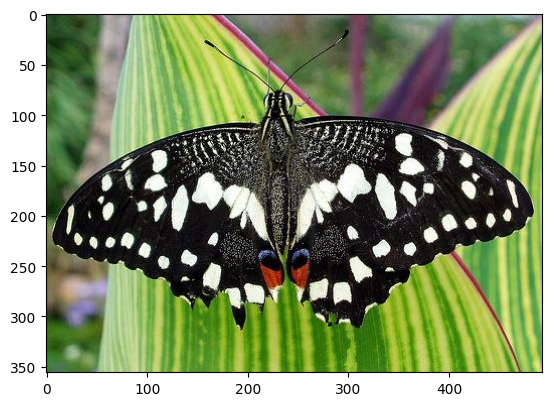

In [6]:
image_ = cv2.imread(butterfly)
image_ = cv2.cvtColor(image_, cv2.COLOR_BGR2RGB)
print("The type of read image is: ", type(image_))
plt.imshow(image_)

In [7]:
print("Image shape is : ",image_.shape)
print("Total pixel number is :", image_.shape[0]*image_.shape[1]*image_.shape[2])

Image shape is :  (356, 493, 3)
Total pixel number is : 526524


## Section 1.2 RGB to GRAY Scale <a class="anchor"  id="section1_2"></a>


orginal lena shape : (512, 512, 3)
gray scale lena shape : (512, 512)


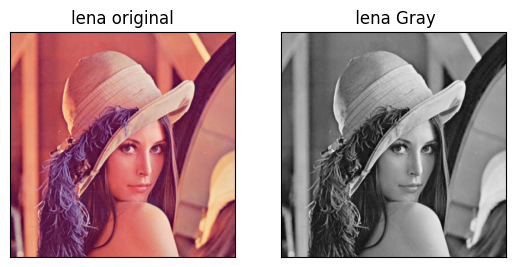

In [8]:
lena_rgb = cv2.imread(lena)
lena_rgb = cv2.cvtColor(lena_rgb, cv2.COLOR_BGR2RGB)
print("orginal lena shape :", lena_rgb.shape)

lena_gray = cv2.imread(lena)
lena_gray = cv2.cvtColor(lena_gray, cv2.COLOR_BGR2GRAY)
print("gray scale lena shape :", lena_gray.shape)

titles= [ "lena original", " lena Gray"]
images = [lena_rgb,lena_gray]

for i in range(2):
    plt.subplot(1,2,i+1,title="line-up pictures")
    plt.imshow(images[i], "gray")
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])
plt.show()

For RGB color images by matplotlib


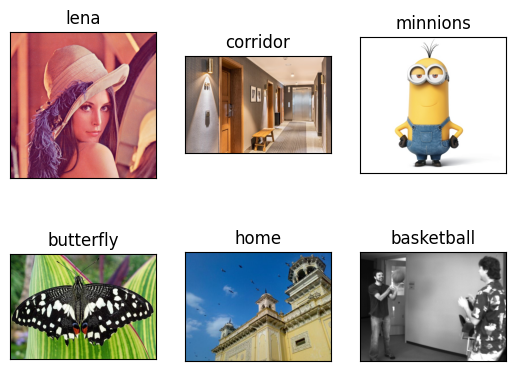

For GRAY color images by matplotlib


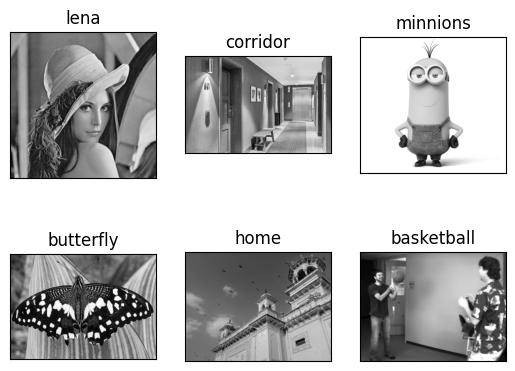

In [9]:
titles = ["lena", "corridor", "minnions","butterfly","home","basketball"]

print("For RGB color images by matplotlib")
for i in range(6):
    image = cv2.imread(dic[i])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.subplot(2,3,i+1,title="line-up pictures")
    plt.imshow(image, "gray")
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])
plt.show()


print("For GRAY color images by matplotlib")
for i in range(6):
    image = cv2.imread(dic[i])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    plt.subplot(2,3,i+1,title="line-up pictures")
    plt.imshow(image, "gray")
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])
plt.show()

## Section 1.3 Resize, Flip and Rotate <a class="anchor"  id="section1_3"></a>

###1.3.1 Resizing an Image <a class="anchor"  id="subsection1_3_1"></a>




Original Dimensions :  (512, 512, 3)
Resized Dimensions :  (256, 256, 3)


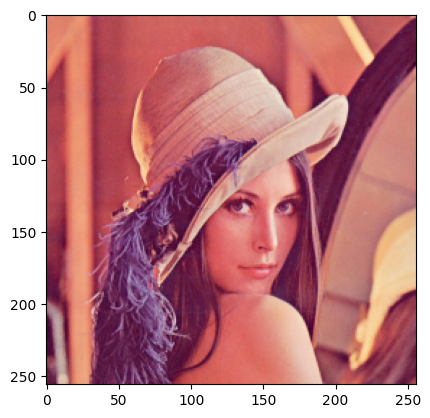

In [21]:
lena_rgb = cv2.imread(lena, cv2.IMREAD_UNCHANGED)
lena_rgb = cv2.cvtColor(lena_rgb, cv2.COLOR_BGR2RGB)
print('Original Dimensions : ',lena_rgb.shape)

scale_percent = 0.50 #50% Rescale
width = int(lena_rgb.shape[1] * scale_percent )
height = int(lena_rgb.shape[0] * scale_percent )
dim = (width, height)

# resize image
resized = cv2.resize(lena_rgb, dim, interpolation = cv2.INTER_AREA)
print('Resized Dimensions : ',resized.shape)
plt.imshow(resized)

Original Dimensions :  (512, 512, 3)
Resized Dimensions :  (290, 620, 3)


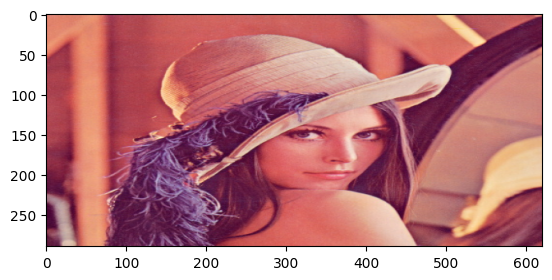

In [11]:
lena_rgb = cv2.imread(lena, cv2.IMREAD_UNCHANGED)
lena_rgb = cv2.cvtColor(lena_rgb, cv2.COLOR_BGR2RGB)
print('Original Dimensions : ',lena_rgb.shape)

width = 620
height =290
dim = (width, height)
resized = cv2.resize(lena_rgb, dim, interpolation = cv2.INTER_AREA)
print('Resized Dimensions : ',resized.shape)
plt.imshow(resized)

### Sub-section 1.3.2 Flipping an Image <a class="anchor"  id="subsection1_3_2"></a>

original shape is:  (512, 512, 3)
horizontal flip shape is:  (512, 512, 3)
vertical flip shape is:  (512, 512, 3)


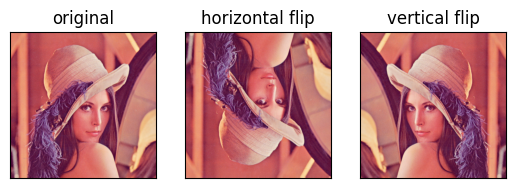

In [12]:
lena_flip_hor = cv2.flip(lena_rgb, 0)
lena_flip_ver = cv2.flip(lena_rgb, 1)
titles = ["original","horizontal flip","vertical flip" ]
imdic = [lena_rgb, lena_flip_hor,lena_flip_ver]
print("original shape is: ", lena_rgb.shape)
print("horizontal flip shape is: ", lena_flip_hor.shape)
print("vertical flip shape is: ", lena_flip_ver.shape)


for i in range(3):
    plt.subplot(1,3,i+1)
    plt.imshow(imdic[i], "gray")
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])
plt.show()

### Sub-section 1.3.3 Rotating an Image <a class="anchor"  id="subsection1_3_3"></a>


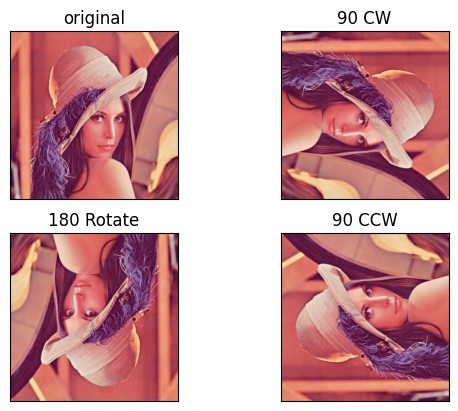

In [14]:
lena_90cw = cv2.rotate(lena_rgb, cv2.ROTATE_90_CLOCKWISE)
lena_180cw = cv2.rotate(lena_rgb, cv2.ROTATE_180)
lena_90ccw = cv2.rotate(lena_rgb, cv2.ROTATE_90_COUNTERCLOCKWISE)
titles=["original", "90 CW", "180 Rotate", "90 CCW"]
imdic = [ lena_rgb, lena_90cw , lena_180cw  ,lena_90ccw]
for i in range(4):
    plt.subplot(2,2,i+1)
    plt.imshow(imdic[i], "gray")
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])
plt.show()


Look it's done and amazing!


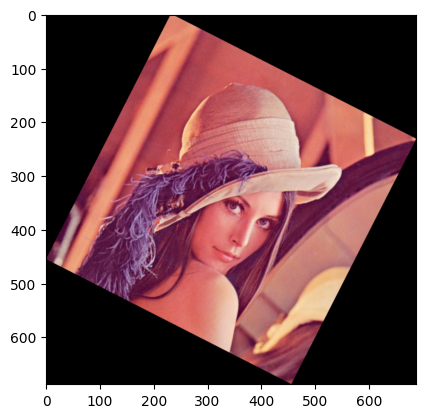

In [15]:
angle = 27
rotated = imutils.rotate_bound(lena_rgb, angle)
plt.imshow(rotated)
print("Look it's done and amazing!")

## Section 1.4 Adding Text  <a class="anchor"  id="section1_4"></a>


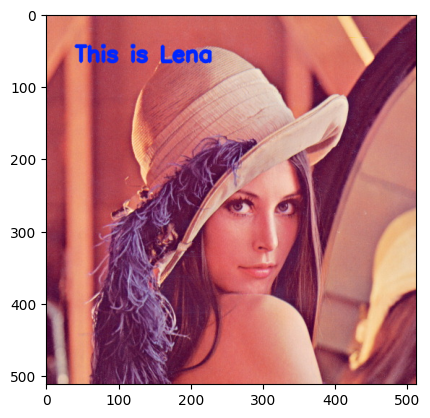

In [22]:
font = cv2.FONT_HERSHEY_SIMPLEX
fontScale = 1
color = (0, 38, 255)
thickness = 3

org = (40, 65)
text = "This is Lena"
image_text = cv2.putText(lena_rgb, text, org, font, fontScale,  color, thickness, cv2.LINE_AA, False)
plt.imshow(image_text)

## Section 1.5 Drawing shapes  <a class="anchor"  id="section1_5"></a>


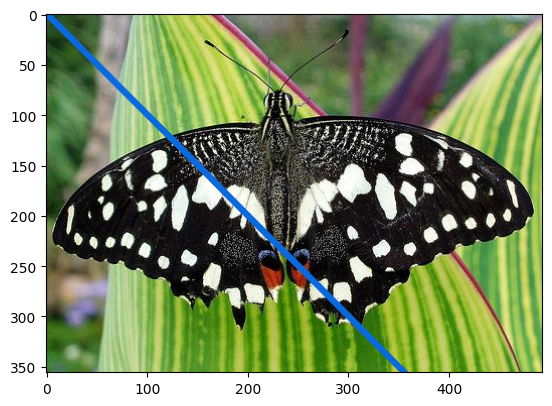

In [23]:
start_point = (0, 0)
end_point = (500, 500)
color = (10, 105, 220)
thickness = 5
image_ = cv2.line(image_, start_point, end_point, color, thickness)
plt.imshow(image_)

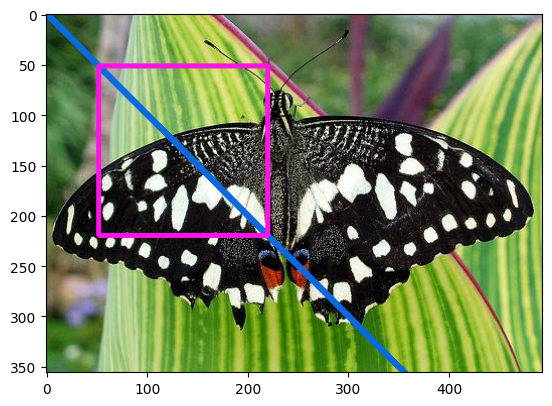

In [24]:
start_point = (52, 52)
end_point = (220, 220)
color = (255, 20,230)
thickness = 4
image_ = cv2.rectangle(image_, start_point, end_point, color, thickness)
plt.imshow(image_)

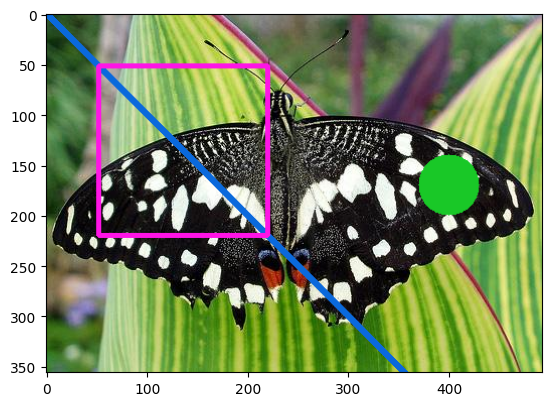

In [25]:
center_coordinates = (400, 170)
color = (25, 200,39)
radius = 30
thickness = -1 # -1 is fullfil, 1,2 is empty circle
image_ = cv2.circle(image_, center_coordinates, radius, color, thickness)
plt.imshow(image_)

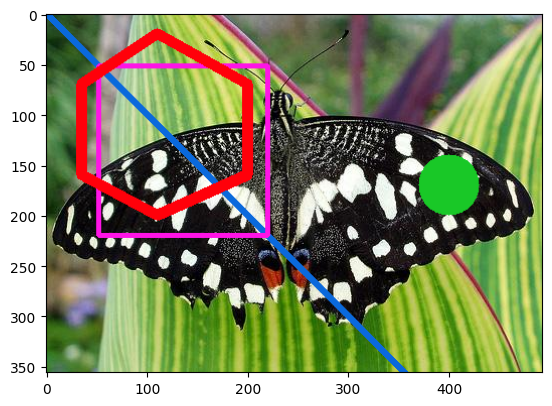

In [26]:
pts = np.array([[35, 70], [35, 160], [110, 200], [200, 160], [200, 70], [110, 20]],np.int32)
pts = pts.reshape((-1, 1, 2))
isClosed = True
color = (255, 0, 10)
thickness = 9
image_ = cv2.polylines(image_, [pts], isClosed, color, thickness)
plt.imshow(image_)

## Section 1.6 Cropping & Region of Interest <a class="anchor"  id="section1_6"></a>


original shape:  (480, 640, 3)


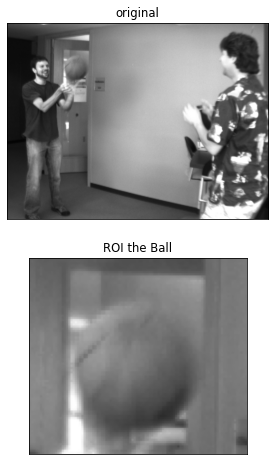

roi shape:  (90, 100, 3)


In [27]:
basketball_rgb = cv2.imread(basketball, cv2.IMREAD_UNCHANGED)
basketball_rgb = cv2.cvtColor(basketball_rgb, cv2.COLOR_BGR2RGB)
print("original shape: ", basketball_rgb.shape)
roi = basketball_rgb[60:150,120:220]


titles=["original", "ROI the Ball"]
imdic = [ basketball_rgb, roi]
figure(figsize=(12,8), dpi=70)
for i in range(2):
    plt.subplot(2,1,i+1)
    plt.imshow(imdic[i], "gray")
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])
plt.show()
print("roi shape: ",roi.shape)

## Section 2.1 Histograms <a class="anchor"  id="section2_1"></a>


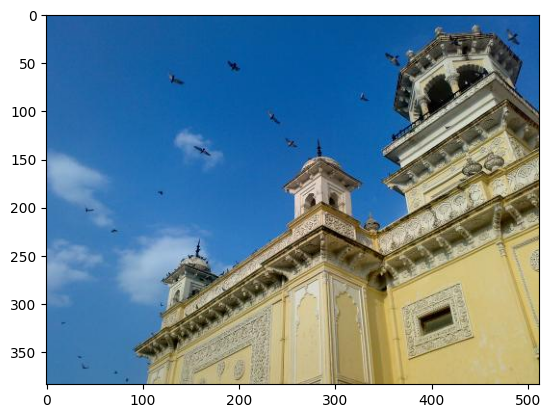

In [28]:
image = cv2.imread(home)
home_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(home_rgb)

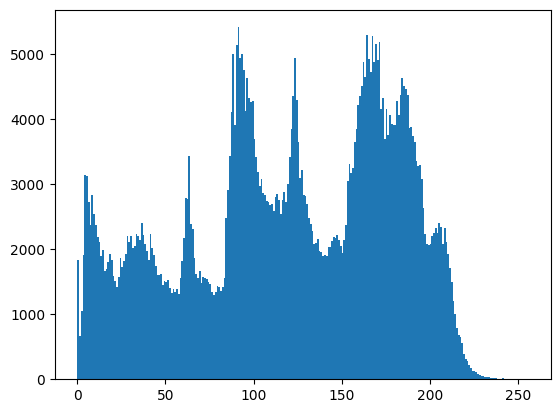

In [29]:
histogram = cv2.calcHist([home_rgb], [0], None, [256], [0, 256])
plt.hist(home_rgb.ravel(), 256, [0, 256]); plt.show()

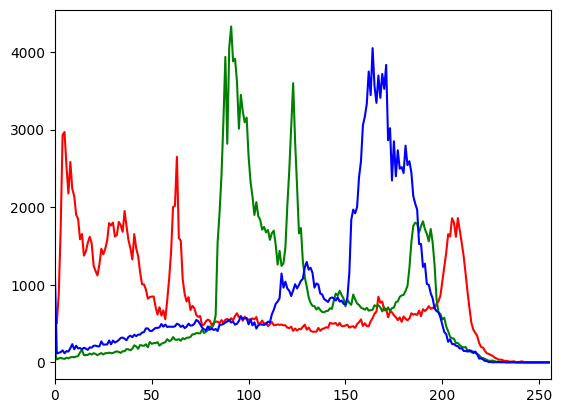

In [30]:
color = ('r', 'g', 'b')
for i, col in enumerate(color):
    histogram_rgb = cv2.calcHist([home_rgb], [i], None, [256], [0, 256])
    plt.plot(histogram_rgb, color = col)
    plt.xlim([0,256])

## Section 2.2 Linear Filters <a class="anchor"  id="section2_2"></a>

**Convolution**



![cnv](https://ai.stanford.edu/~syyeung/cvweb/gifs/moving%20average.gif)



shape is:  (512, 512, 3)


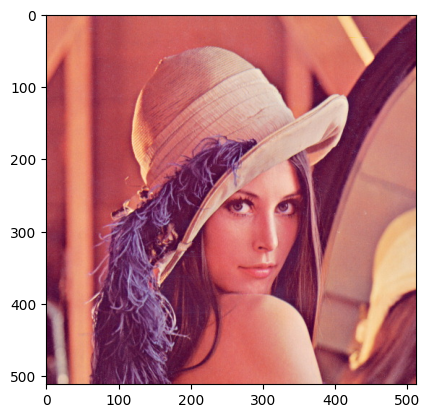

In [31]:
image = cv2.imread(lena)
image_ = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image_)
print("shape is: ",image_.shape)

## Section 2.2.1 Blur <a class="anchor"  id="section2_2_1"></a>

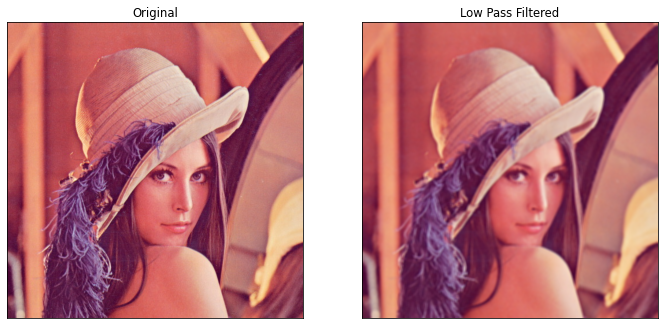

In [32]:
# 3x3 Low Pass Filter In image processing these sorts of filters are often used for blurring
low_pass_kernel=np.array([[1/9,1/9,1/9], [1/9,1/9,1/9], [1/9,1/9,1/9]])
# 5x5 Low Pass Filter In image processing these sorts of filters are often used for blurring
low_pass_kernel2 = np.ones((5,5),np.float32)/25

low_pass = cv2.filter2D(image_, -1, low_pass_kernel2)
figure(figsize=(12,8), dpi=70)
plt.subplot(121),plt.imshow(image_),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(low_pass),plt.title('Low Pass Filtered')
plt.xticks([]), plt.yticks([])
plt.show()

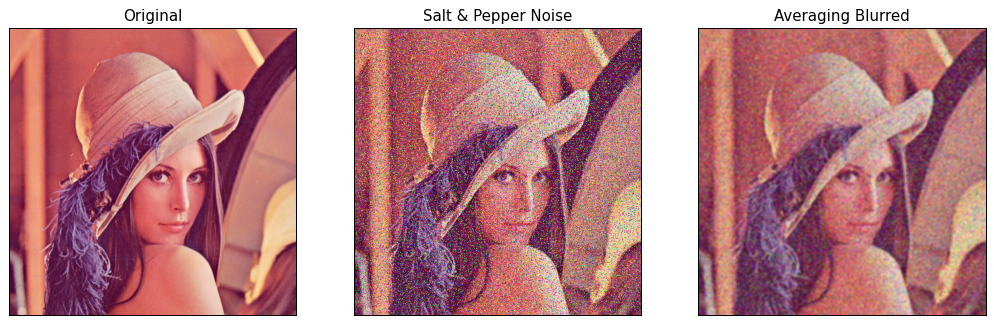

In [33]:
figure(figsize=(14,8), dpi=90)
lena_noisy = random_noise(image_, mode='s&p',amount=0.2)
low_pass = cv2.filter2D(lena_noisy, -1, low_pass_kernel2)

titles = ["Original", "Salt & Pepper Noise", "Averaging Blurred"]
imdic = [ image_, lena_noisy, low_pass]

for i in range(3):
    plt.subplot(1,3,i+1)
    plt.imshow(imdic[i], "gray")
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])
plt.show()



![Gaussian Kernel](https://homepages.inf.ed.ac.uk/rbf/HIPR2/figs/gausmask.gif)

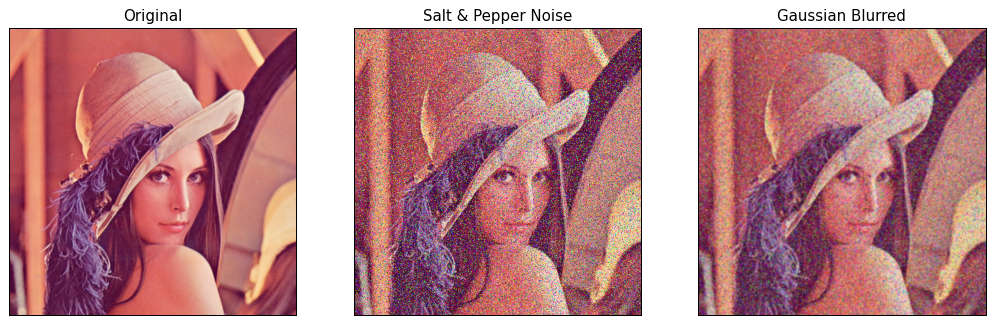

In [34]:
blur = cv2.GaussianBlur(lena_noisy,(5,5),1)

titles = ["Original", "Salt & Pepper Noise", "Gaussian Blurred"]
imdic = [ image_, lena_noisy, blur]
figure(figsize=(14,8), dpi=90)
for i in range(3):
    plt.subplot(1,3,i+1)
    plt.imshow(imdic[i], "gray")
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])
plt.show()


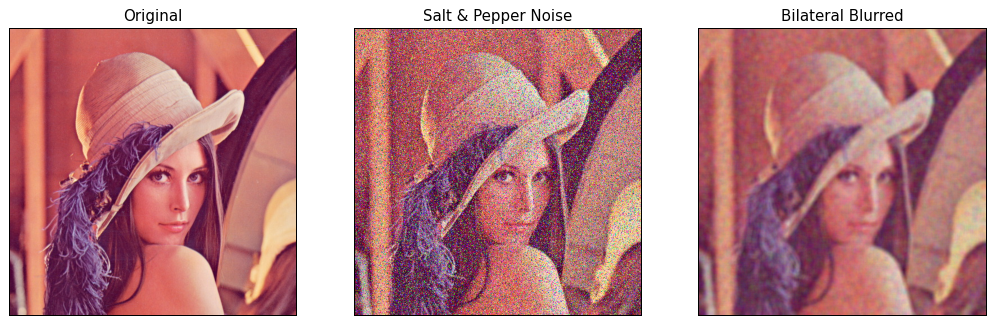

In [35]:
bilateral_blur = cv2.bilateralFilter(lena_noisy.astype(np.float32),10,75,75)

titles = ["Original", "Salt & Pepper Noise", "Bilateral Blurred"]
imdic = [ image_, lena_noisy, bilateral_blur]
figure(figsize=(14,8), dpi=90)
for i in range(3):
    plt.subplot(1,3,i+1)
    plt.imshow(imdic[i], "gray")
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])
plt.show()

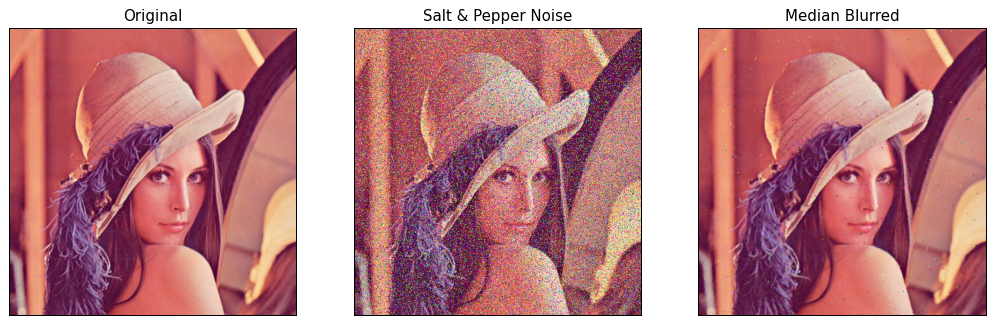

In [36]:
median_blur = cv2.medianBlur(lena_noisy.astype(np.float32),3)

titles = ["Original", "Salt & Pepper Noise", "Median Blurred"]
imdic = [ image_, lena_noisy, median_blur]
figure(figsize=(14,8), dpi=90)
for i in range(3):
    plt.subplot(1,3,i+1)
    plt.imshow(imdic[i], "gray")
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])
plt.show()

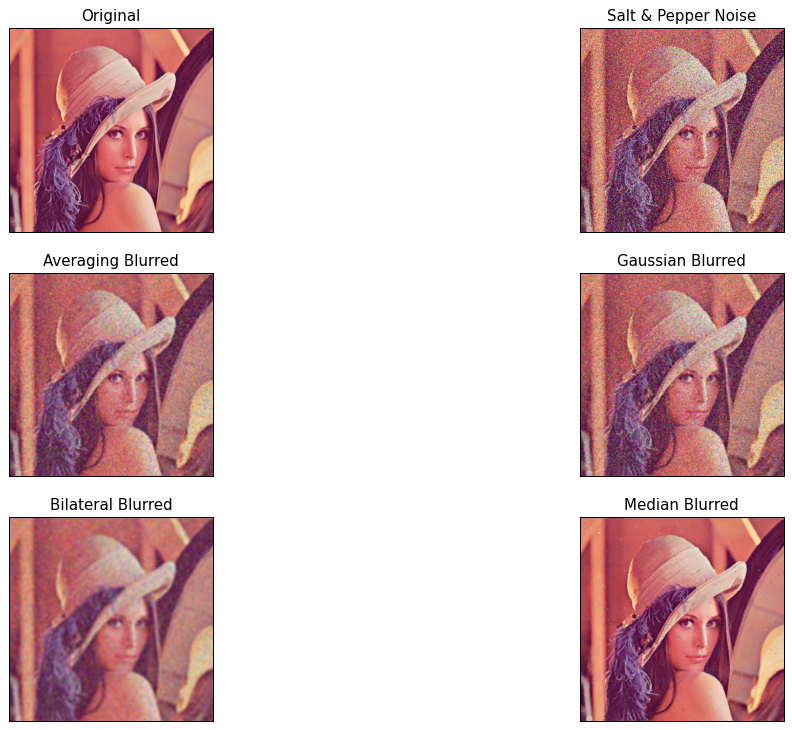

In [37]:
titles = ["Original", "Salt & Pepper Noise",  "Averaging Blurred", "Gaussian Blurred","Bilateral Blurred", "Median Blurred"]
imdic = [ image_, lena_noisy, low_pass,blur,bilateral_blur, median_blur]
figure(figsize=(15,10), dpi=90)
for i in range(6):
    plt.subplot(3,2,i+1)
    plt.imshow(imdic[i], "gray")
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])
plt.show()

## Section 2.2.2 Sharpening <a class="anchor"  id="section2_2_2"></a>







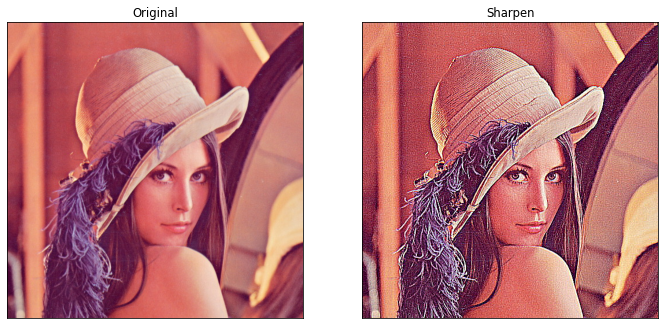

In [38]:
# 3x3 High Pass Filter In image processing these sorts of filters are often called edge-detectors
Sharp_kernel  = np.array([[-1, -1, -1], [-1,  9, -1], [-1, -1, -1]])
sharpen = cv2.filter2D(image_, -1, Sharp_kernel )

figure(figsize=(12,8), dpi=70)
plt.subplot(121),plt.imshow(image_),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(sharpen),plt.title('Sharpen')
plt.xticks([]), plt.yticks([])
plt.show()

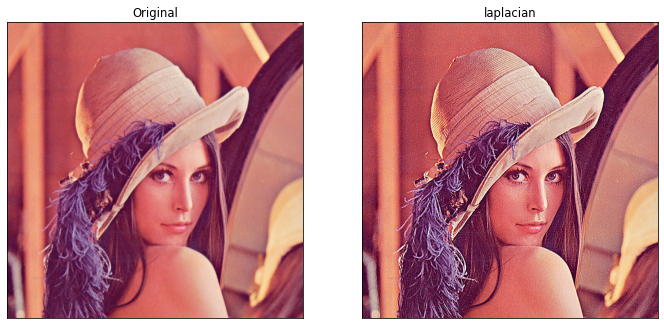

In [39]:
# 3x3 Laplacian
laplacian= np.array([[0, -1, 0], [-1,  5, -1], [0, -1, 0]])

laplacian= cv2.filter2D(image_, -1, laplacian)

figure(figsize=(12,8), dpi=70)
plt.subplot(121),plt.imshow(image_),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(laplacian),plt.title('laplacian')
plt.xticks([]), plt.yticks([])
plt.show()

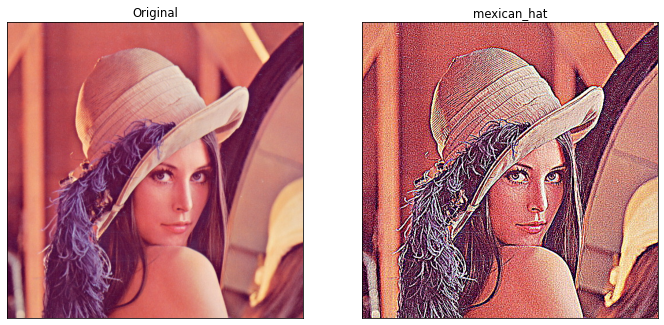

In [40]:
# 5x5 Mexican Hat filter
mexican_hat = np.array([[0,0,-1,0,0],[0,-1,-2,-1,0],[-1,-2,17,-2,-1],[0,-1,-2,-1,0],[0,0,-1,0,0]])

mexican_hat= cv2.filter2D(image_, -1, mexican_hat)

figure(figsize=(12,8), dpi=70)
plt.subplot(121),plt.imshow(image_),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(mexican_hat),plt.title('mexican_hat')
plt.xticks([]), plt.yticks([])
plt.show()

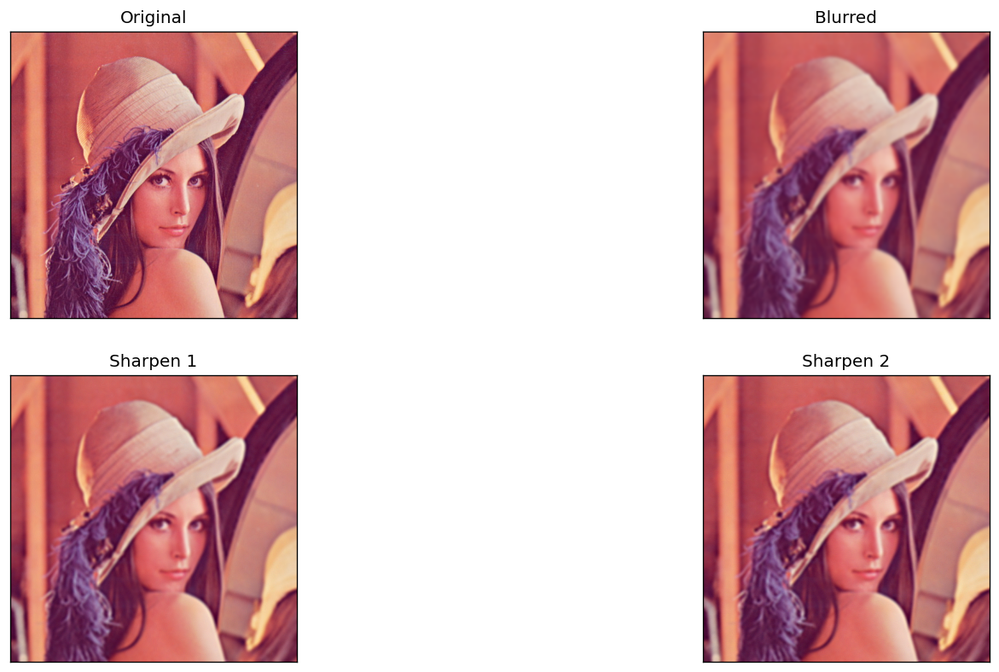

In [41]:
# 3x3 linear smoothing filter In image processing these sorts of filters are often used for blurring
sharpen_filter = np.array([[-1, -2, -1], [-1, 11, -1], [-1, -2, -1]])
low_pass_kernel = np.ones((5,5),np.float32)/25
lena_blurred= cv2.filter2D(image_, -1, low_pass_kernel)
lena_blurred= cv2.filter2D(lena_blurred, -1, low_pass_kernel)
lena_blurred= cv2.filter2D(lena_blurred, -1, low_pass_kernel)

sharpen1 = cv2.filter2D(lena_blurred, -1, Sharp_kernel )
sharpen2 =  cv2.filter2D(lena_blurred, -1, sharpen_filter  )


titles = ["Original", "Blurred",  "Sharpen 1","Sharpen 2"]
imdic = [ image_, lena_blurred, sharpen1 , sharpen2]
figure(figsize=(16,8), dpi=120)
for i in range(4):

    plt.subplot(2,2,i+1)
    plt.imshow(imdic[i], "gray")
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])
plt.show()


## Section 2.2.3 Edge Enhancement <a class="anchor"  id="section2_2_3"></a>


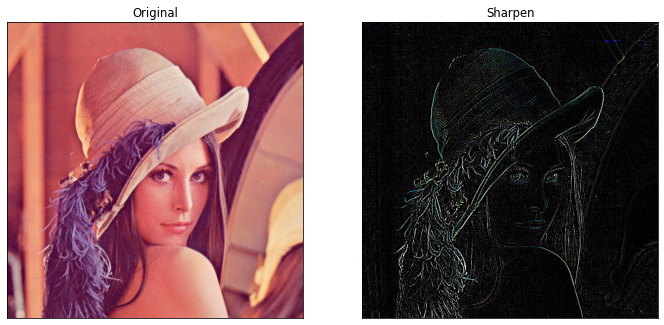

In [42]:
# 3x3 High Pass Filter In image processing these sorts of filters are often called edge-detectors
Sharp_kernel  = np.array([[-1, -1, -1], [-1,  8, -1], [-1, -1, -1]])
sharpen = cv2.filter2D(image_, -1, Sharp_kernel )

figure(figsize=(12,8), dpi=70)
plt.subplot(121),plt.imshow(image_),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(sharpen),plt.title('Sharpen')
plt.xticks([]), plt.yticks([])
plt.show()

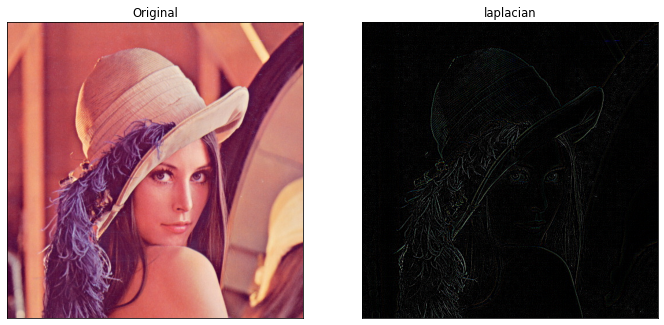

In [43]:
# 3x3 Laplacian
laplacian= np.array([[0, -1, 0], [-1,  4, -1], [0, -1, 0]])

laplacian= cv2.filter2D(image_, -1, laplacian)

figure(figsize=(12,8), dpi=70)
plt.subplot(121),plt.imshow(image_),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(laplacian),plt.title('laplacian')
plt.xticks([]), plt.yticks([])
plt.show()

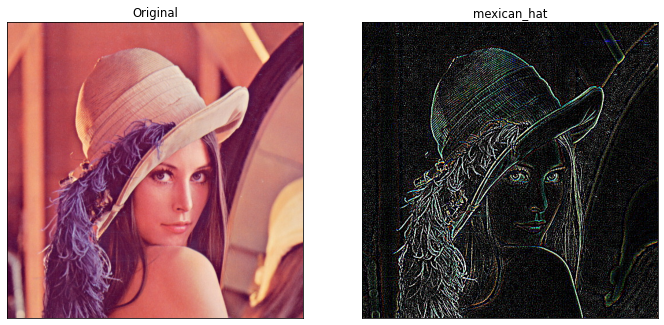

In [44]:
# 5x5 Mexican Hat filter
mexican_hat = np.array([[0,0,-1,0,0],[0,-1,-2,-1,0],[-1,-2,16,-2,-1],[0,-1,-2,-1,0],[0,0,-1,0,0]])

mexican_hat= cv2.filter2D(image_, -1, mexican_hat)

figure(figsize=(12,8), dpi=70)
plt.subplot(121),plt.imshow(image_),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(mexican_hat),plt.title('mexican_hat')
plt.xticks([]), plt.yticks([])
plt.show()

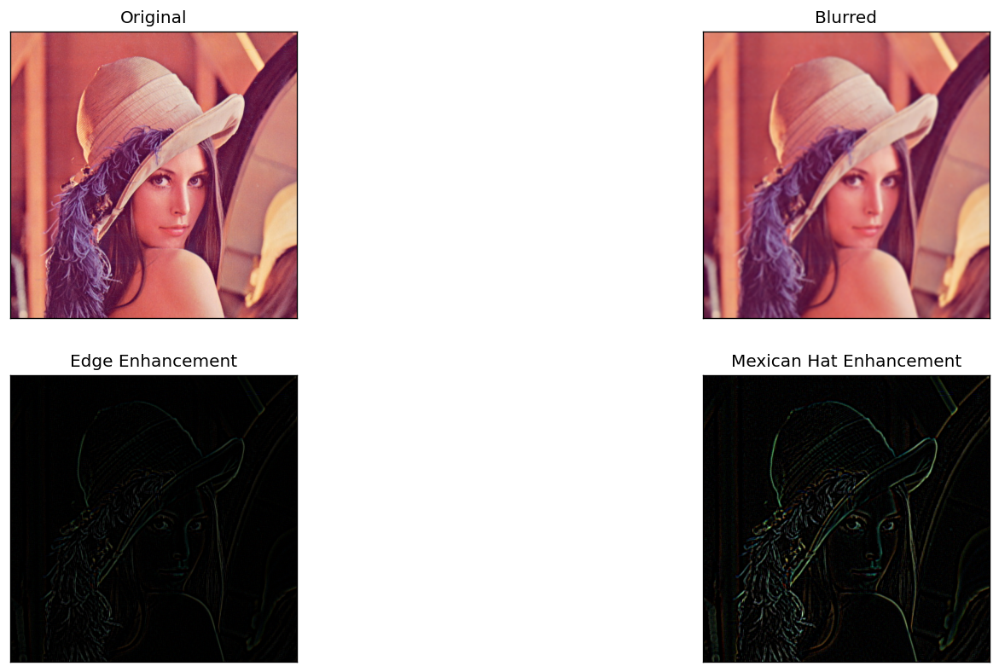

In [45]:
# 3x3 linear smoothing filter In image processing these sorts of filters are often used for blurring
sharpen_filter = np.array([[0,0,-1,0,0],[0,-1,-2,-1,0],[-1,-2,16,-2,-1],[0,-1,-2,-1,0],[0,0,-1,0,0]])
low_pass_kernel = np.ones((5,5),np.float32)/25
lena_blurred= cv2.filter2D(image_, -1, low_pass_kernel)


sharpen1 = cv2.filter2D(lena_blurred, -1, Sharp_kernel )
sharpen2 =  cv2.filter2D(lena_blurred, -1, sharpen_filter  )


titles = ["Original", "Blurred",  "Edge Enhancement","Mexican Hat Enhancement"]
imdic = [ image_, lena_blurred, sharpen1 , sharpen2]
figure(figsize=(16,8), dpi=120)
for i in range(4):

    plt.subplot(2,2,i+1)
    plt.imshow(imdic[i], "gray")
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])
plt.show()
